#**IMPORT LIBRARY & DATA**

In [ ]:
import numpy as np                
import pandas as pd               
import matplotlib.pyplot as plt   
import seaborn as sns             
%matplotlib inline
sns.set_style("darkgrid")

import warnings
warnings.simplefilter(action='ignore')

pd.set_option('float_format', '{:.2f}'.format)  # Show float data in two decimal number

# plotly
# !pip install plotly
!pip install --upgrade plotly --quiet
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)

import plotly.graph_objs as go
import plotly.express as px

# Use Plotly locally
import cufflinks as cf
cf.go_offline()

# Make Plotly work in colab
import plotly.io as pio
pio.renderers.default = 'colab'

     |████████████████████████████████| 23.9 MB 13 kB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/Final Project/bank_marketing_cleaned.csv')

In [ ]:
df.head()

,age,age_group,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,3,housemaid,married,2,0,0,0,telephone,may,mon,261,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,0
1,57,3,services,married,5,unknown,0,0,telephone,may,mon,149,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,0
2,37,3,services,married,5,0,1,0,telephone,may,mon,226,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,0
3,40,3,admin.,married,3,0,0,0,telephone,may,mon,151,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,0
4,56,3,services,married,5,0,0,1,telephone,may,mon,307,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   age_group       41188 non-null  int64  
 2   job             41188 non-null  object 
 3   marital         41188 non-null  object 
 4   education       41188 non-null  int64  
 5   default         41188 non-null  object 
 6   housing         41188 non-null  object 
 7   loan            41188 non-null  object 
 8   contact         41188 non-null  object 
 9   month           41188 non-null  object 
 10  day_of_week     41188 non-null  object 
 11  duration        41188 non-null  int64  
 12  campaign        41188 non-null  int64  
 13  pdays           41188 non-null  int64  
 14  previous        41188 non-null  int64  
 15  poutcome        41188 non-null  object 
 16  emp.var.rate    41188 non-null  float64
 17  cons.price.idx  41188 non-null 

# **CLEAN DATA**

## CLEAN LOAN & HOUSING

### Exploring value's meaning

In [ ]:
for c in df.columns[5:8]:
  print(f'{df[c].value_counts()}\n')

0          32588
unknown     8597
1              3
Name: default, dtype: int64

1          21576
0          18622
unknown      990
Name: housing, dtype: int64

0          33950
1           6248
unknown      990
Name: loan, dtype: int64



In [ ]:
df[(df.housing == 'unknown') &(df.loan == 'unknown')].count()

age               990
age_group         990
job               990
marital           990
education         990
default           990
housing           990
loan              990
contact           990
month             990
day_of_week       990
duration          990
campaign          990
pdays             990
previous          990
poutcome          990
emp.var.rate      990
cons.price.idx    990
cons.conf.idx     990
euribor3m         990
nr.employed       990
y                 990
dtype: int64

- **Discard to change default column**
- **All unknown loans are unknown housing loans**
- **Filling housing and loan 'unknown' value by mean**

### Filling unknown values by mean

In [ ]:
# Find mean value of each column

loans = df[~(df.housing == 'unknown')]
mean_housing = loans.housing.mean().round(2)
mean_loan = loans.loan.mean().round(2)

print(f'mean housing: {mean_housing}\nmean loan: {mean_loan}')

mean housing: inf
mean loan: inf


In [ ]:
# Filling value
df.housing = df.housing.replace('unknown', mean_housing)
df.loan = df.loan.replace('unknown', mean_loan)

#Change column type to numeric
df.housing= df.housing.astype('float32')
df.loan= df.loan.astype('float32')

In [ ]:
# Check
for c in df.columns[5:8]:
  print(f'{df[c].value_counts()}\n')

0          32588
unknown     8597
1              3
Name: default, dtype: int64

1.00    21576
0.00    18622
inf       990
Name: housing, dtype: int64

0.00    33950
1.00     6248
inf       990
Name: loan, dtype: int64



## TEST

In [ ]:
for c in df.columns:
  print(f'{df[c].value_counts()}\n')

# **BASIC EDA**

## ANALYSIS PREPARATION

In [ ]:
#@title Helped function to plot correlation heatmap: corr_heatmap(df,size)
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list(name='test', colors=['red','white','green'])

def corr_heatmap(df,size):
  plt.figure(figsize=(size, size))

  sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap=cmap, vmin=-0.99, vmax=.99, center=0.00,
            square=True, annot_kws={"size": 12}, cbar_kws={"shrink": .5})

  plt.show()

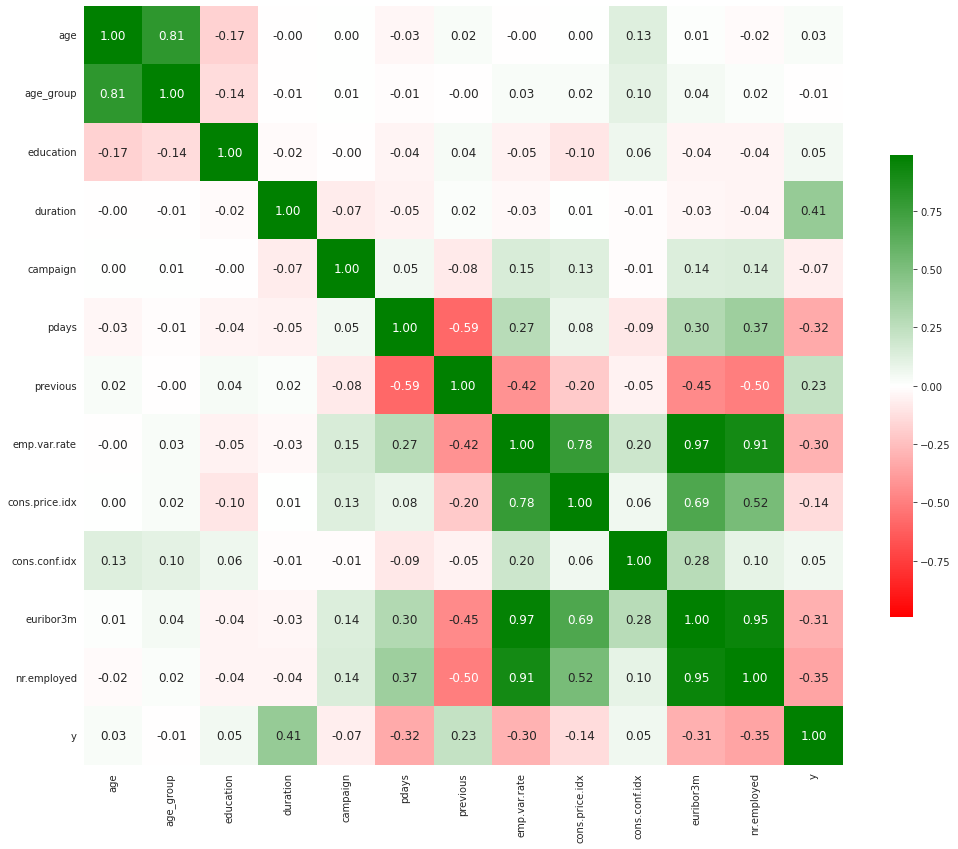

In [ ]:
# There are negative correlation between external factors and convervison 

corr_heatmap(df, 17)

In [ ]:
# GROUP 1: All basic information of a client
client = df.columns[0:8]

#GROUP 2: Related with the last contact of the current campaign
ccampaign = df.columns[8:13]

# GROUP 3: previous campaign attributes
pcampaign = df.columns[13:16]

# GROUP 4: Social and economic context attributes
context = df.columns[16:-1]

# GROUP 5: True label
conversion = df.columns[-1]

print(f'Basic client information:\n{client}\n')
print(f'Related with the last contact of the current campaign:\n{ccampaign}\n')
print(f'Previous campaign attributes:\n{pcampaign}\n')
print(f'Social and economic context attributes:\n{context}\n')
print(f'True label:\n{conversion}\n')

Basic client information:
Index(['age', 'age_group', 'job', 'marital', 'education', 'default', 'housing',
       'loan'],
      dtype='object')

Related with the last contact of the current campaign:
Index(['contact', 'month', 'day_of_week', 'duration', 'campaign'], dtype='object')

Previous campaign attributes:
Index(['pdays', 'previous', 'poutcome'], dtype='object')

Social and economic context attributes:
Index(['emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed'],
      dtype='object')

True label:
y



## BASIC CLIENT INFO EDA

In [ ]:
# Create new dataframe with only client data and conversion

client_df = df[client].drop(columns=['age_group'])
client_df['conversion'] = df['y']
client_df.head()

,age,job,marital,education,default,housing,loan,conversion
0,56,housemaid,married,2,0,0.00,0.00,0
1,57,services,married,5,unknown,0.00,0.00,0
2,37,services,married,5,0,1.00,0.00,0
3,40,admin.,married,3,0,0.00,0.00,0
4,56,services,married,5,0,0.00,1.00,0


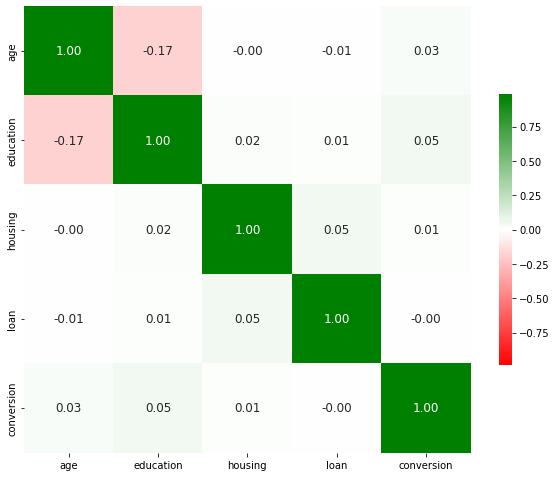

In [ ]:
corr_heatmap(client_df, 10)

### Age Analysis

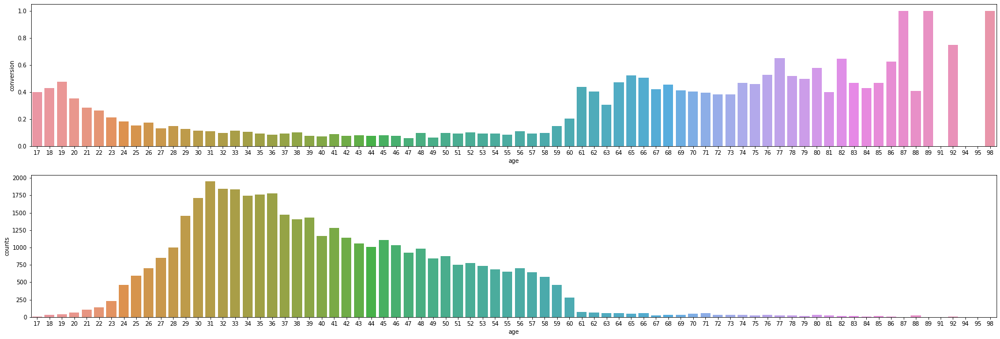

In [ ]:
# Find conversion rate and total count by age
gr_age = client_df.groupby('age').agg(conversion=('conversion', 'mean'), counts=('conversion', 'count'))
gr_age['success_count'] = gr_age['conversion'] * gr_age['counts']

#Ploting data
plt.figure(figsize=(30,10))

plt.subplot(211)
sns.barplot(data = gr_age, x = gr_age.index, y = 'conversion')

plt.subplot(212)
sns.barplot(data = gr_age, x = gr_age.index, y = 'counts')

plt.show()

In [ ]:
# We will group 6 ages into 1 sample to plot

age_group_6 =[]
i = gr_age.index.min() + 6

for i in np.arange(i, gr_age.index.max()+1, 6):
  rate = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['conversion'].mean()
  counts = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['counts'].sum()
  success = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['success_count'].sum()
  range = f'{i-6}_{i-1}'

  dicts = {'age_range'      : range,
           'conversion_rate': rate,
           'total_count'    : counts,
           'success_count'  : success}

  age_group_6.append(dicts)
  
age_group_6_df = pd.DataFrame(age_group_6)
age_group_6_df.head()

,age_range,conversion_rate,total_count,success_count
0,17_22,0.37,379,122.00
1,23_28,0.17,3837,614.00
2,29_34,0.11,10538,1186.00
3,35_40,0.09,9014,799.00
4,41_46,0.08,6619,540.00


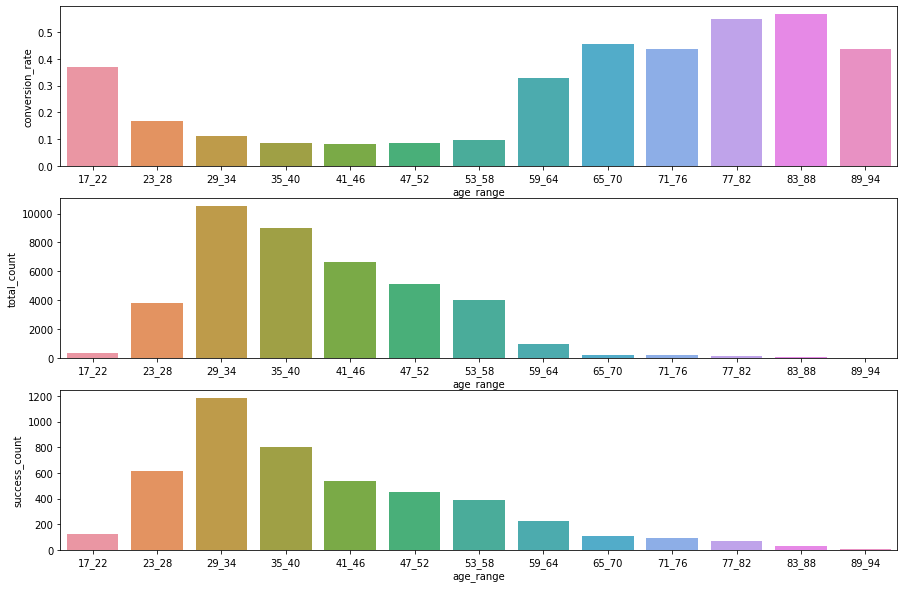

In [ ]:
#Plotting age group

plt.figure(figsize=(15,10))

plt.subplot(311)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'conversion_rate')

plt.subplot(312)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'total_count')

plt.subplot(313)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'success_count')

plt.show()

**OBSERVATION**:
- Potential market to take a trial to concentrate on the next campaign for this product: **students** (17-22 years old) and **elderly** (above 59 years old)

**LET'S FINDING AGE OUTLIER**

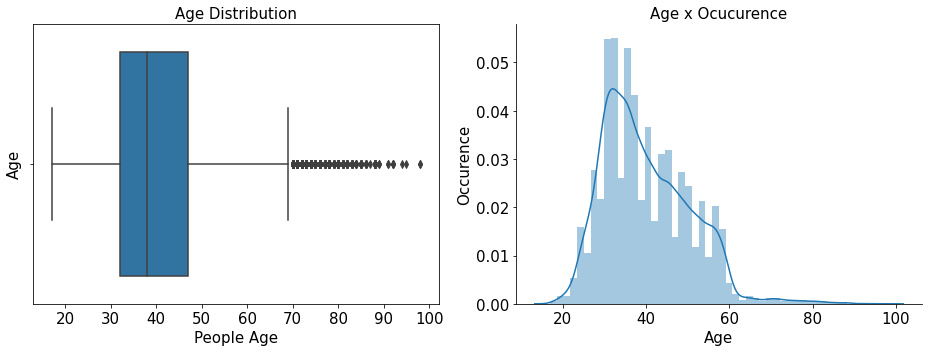

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 5))
sns.boxplot(x = 'age', data = client_df, orient = 'v', ax = ax1)
ax1.set_xlabel('People Age', fontsize=15)
ax1.set_ylabel('Age', fontsize=15)
ax1.set_title('Age Distribution', fontsize=15)
ax1.tick_params(labelsize=15)

sns.distplot(client_df['age'], ax = ax2)
sns.despine(ax = ax2)
ax2.set_xlabel('Age', fontsize=15)
ax2.set_ylabel('Occurence', fontsize=15)
ax2.set_title('Age x Ocucurence', fontsize=15)
ax2.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout() 

This is how we calculate the interquartile range and define outliers:
  * Interquartile range, IQR = Q3 - Q1
  * Lower 1.5*IQR whisker = Q1 - 1.5 * IQR 
  * Upper 1.5*IQR whisker = Q3 + 1.5 * IQR

In [ ]:
Q1 = client_df['age'].quantile(q=0.25)
Q2 = client_df['age'].quantile(q=0.50)
Q3 = client_df['age'].quantile(q=0.75)

age_IQR = Q3 - Q1
age_outlier = Q3 + 1.5*age_IQR

print(f'1st Quartile: {Q1} \n2nd Quartile: {Q2} \n3rd Quartile: {Q3} \n\nAges above {age_outlier} are outliers')


1st Quartile: 32.0 
2nd Quartile: 38.0 
3rd Quartile: 47.0 

Ages above 69.5 are outliers


### Education & Job Analysis

In [ ]:
job_edu = df.groupby(['job']).agg(conversion=('y','mean'), counts=('age','count')).sort_values(['conversion','counts'], ascending=[False,False])

In [ ]:
job_edu

,conversion,counts
job,,
student,0.31,875
retired,0.25,1720
unemployed,0.14,1014
admin.,0.13,10422
management,0.11,2924
unknown,0.11,330
technician,0.11,6743
self-employed,0.10,1421
housemaid,0.10,1060


In [ ]:
df.y.mean()

0.11265417111780131

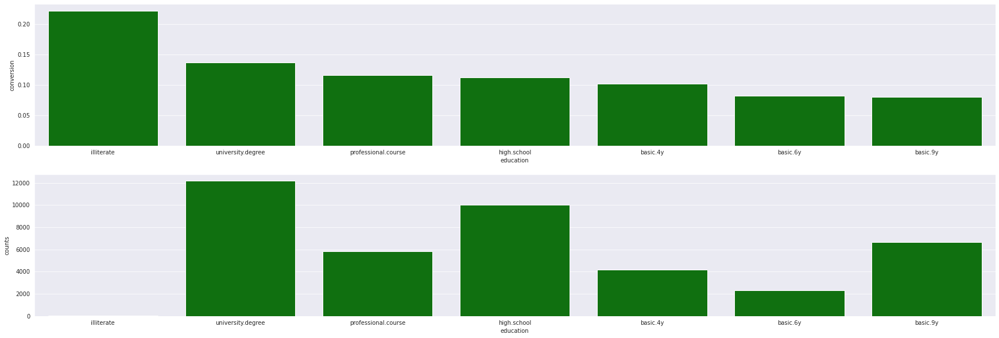

In [ ]:
#@title EDUCATION TO CONVERSION
df_copy = df.copy()
conditions = [df_copy.education == 1,
              df_copy.education == 2,
              df_copy.education == 3,
              df_copy.education == 4,
              df_copy.education == 5,
              df_copy.education == 6,
              df_copy.education == 7]

values = ['illiterate', 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'professional.course', 'university.degree']

df_copy.education = np.select(conditions, values, default='unknown')

edu = df_copy.groupby(['education']).agg(conversion=('y','mean'), counts=('age','count')).sort_values(['conversion','counts'], ascending=[False,False])

plt.figure(figsize=(30,10))

plt.subplot(211)
sns.barplot(data = edu,
            x = edu.index,
            y = 'conversion',color='green')

plt.subplot(212)
sns.barplot(data = edu,
            x = edu.index,
            y = 'counts',color='green')

plt.show()

## CAMPAIGN EDA

In [ ]:
campaign_df = df[list(client) + list(ccampaign)]
campaign_df['conversion'] = df['y']
campaign_df.head()

,age,age_group,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,conversion
0,56,3,housemaid,married,basic.4y,0,0,0,telephone,may,mon,261,1,0
1,57,3,services,married,high.school,unknown,0,0,telephone,may,mon,149,1,0
2,37,3,services,married,high.school,0,1,0,telephone,may,mon,226,1,0
3,40,3,admin.,married,basic.6y,0,0,0,telephone,may,mon,151,1,0
4,56,3,services,married,high.school,0,0,1,telephone,may,mon,307,1,0


### What is the ideal call frequency per single client?

In [ ]:
# Let's having a look at the performance of every contact frequency

campaign = campaign_df.groupby('campaign').agg(conversion=('conversion','mean'),counts=('conversion','count')).sort_values('conversion', ascending=False)
campaign['success_count'] = campaign.conversion * campaign.counts
campaign['success_count'] = campaign['success_count'].round().astype(int)
campaign.conversion = (campaign.conversion * 100).round(2).astype('float32')

campaign.head(10).style.background_gradient(cmap='Greens').set_precision(2)

,conversion,counts,success_count
campaign,,,
1,13.04,17642,2300
2,11.46,10570,1211
3,10.75,5341,574
4,9.39,2651,249
6,7.66,979,75
5,7.50,1599,120
17,6.90,58,4
11,6.78,177,12
23,6.25,16,1


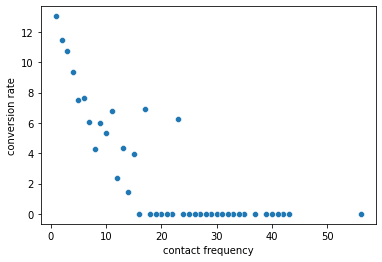

In [ ]:
# Correlation between contact frequency and conversion rate by scatterplot

sns.scatterplot(data=campaign,
                y='rate',
                x=campaign.index)
plt.xlabel('contact frequency')
plt.ylabel('conversion rate')

plt.show()

**Now we are moving to IQR method to find the answer**

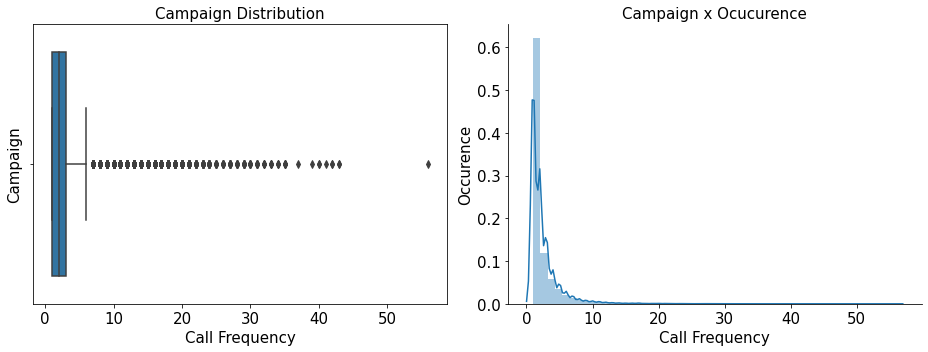

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 5))
sns.boxplot(x = 'campaign', data = campaign_df, orient = 'v', ax = ax1)
ax1.set_xlabel('Call Frequency', fontsize=15)
ax1.set_ylabel('Campaign', fontsize=15)
ax1.set_title('Campaign Distribution', fontsize=15)
ax1.tick_params(labelsize=15)

sns.distplot(campaign_df['campaign'], ax = ax2)
sns.despine(ax = ax2)
ax2.set_xlabel('Call Frequency', fontsize=15)
ax2.set_ylabel('Occurence', fontsize=15)
ax2.set_title('Campaign x Ocucurence', fontsize=15)
ax2.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout() 

In [ ]:
Q1 = campaign_df['campaign'].quantile(q=0.25)
Q2 = campaign_df['campaign'].quantile(q=0.50)
Q3 = campaign_df['campaign'].quantile(q=0.75)

age_IQR = Q3 - Q1
age_outlier = Q3 + 1.5*age_IQR

print(f'1st Quartile: {Q1} \n2nd Quartile: {Q2} \n3rd Quartile: {Q3} \n\nFrequency above {age_outlier} are outliers')

1st Quartile: 1.0 
2nd Quartile: 2.0 
3rd Quartile: 3.0 

Frequency above 6.0 are outliers


**OBSERVATION**:
- When the customer in need, the will accept at the 1st call
- ideal recommended contact frequency are 1 to 4 while 5 & 6 are acceptable

### How Many Calls Were Made To Convince Students And Elderly?

In [ ]:
campaign_df.head()

,age,age_group,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,conversion
0,56,3,housemaid,married,2,0,0.00,0.00,telephone,may,mon,261,1,0
1,57,3,services,married,5,unknown,0.00,0.00,telephone,may,mon,149,1,0
2,37,3,services,married,5,0,1.00,0.00,telephone,may,mon,226,1,0
3,40,3,admin.,married,3,0,0.00,0.00,telephone,may,mon,151,1,0
4,56,3,services,married,5,0,0.00,1.00,telephone,may,mon,307,1,0


In [ ]:
campaign_df.groupby('age_group').agg(avg=('campaign', 'mean'))

,avg
age_group,
1,2.32
2,2.53
3,2.62
4,2.09


In [ ]:
success_campaign_df = campaign_df[campaign_df.conversion == 1]
success_campaign_df.groupby('age_group').agg(avg=('campaign', 'mean'))

,avg
age_group,
1,1.87
2,2.06
3,2.11
4,1.83


# **MAIN DATA ANALYSIS**

In [ ]:
#@title Pandas Profiling Report
#

!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip --quiet
import pandas_profiling as pp
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title='Pandas Profiling Report', html={'style':{'full_width':False}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## HOW PEOPLE REACT ON THE CAMPAIGN BY DIFFERENT AGES AND JOBS?

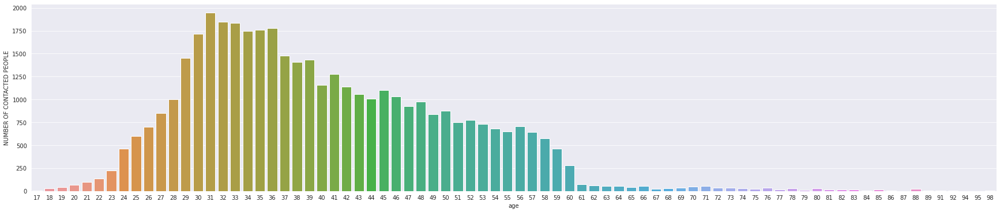

In [ ]:
#@title NUMBER OF CONTACTED PEOPLE DISTRIBUTED BY AGE
plt.figure(figsize=(30,6))

sns.countplot(data=df, x='age')
plt.ylabel('NUMBER OF CONTACTED PEOPLE')

plt.show()

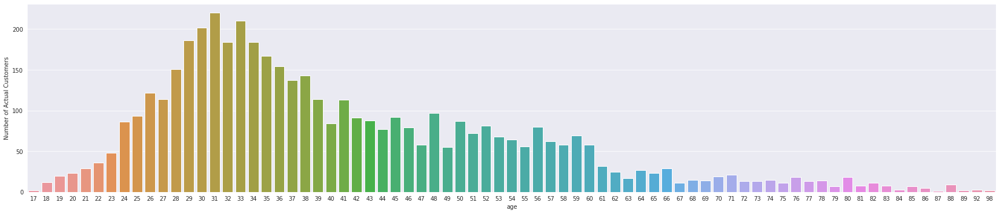

In [ ]:
#@title NUMBER OF ACTUAL CUSTOMERS DISTRIBUTED BY AGE

yes_df = df[df.y == 1]
plt.figure(figsize=(30,6))

sns.countplot(data=yes_df, x='age')
plt.ylabel('Number of Actual Customers')

plt.show()

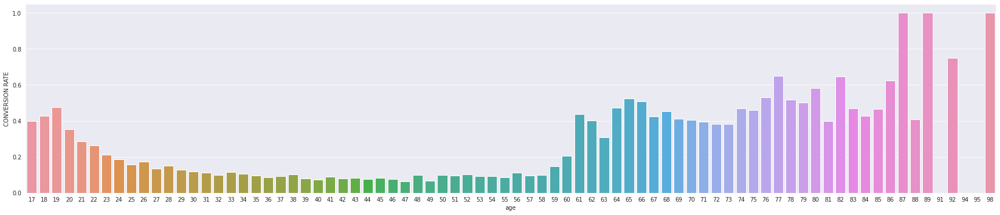

In [ ]:
#@title CONVERSION RATE BY AGE
# Find conversion rate and total count by age
gr_age = df.groupby('age').agg(conversion=('y', 'mean'), counts=('y', 'count'))
gr_age['success_count'] = gr_age['conversion'] * gr_age['counts']

#Ploting data
plt.figure(figsize=(30,6))
sns.barplot(data = gr_age, x = gr_age.index, y = 'conversion')
plt.ylabel('CONVERSION RATE')

plt.show()

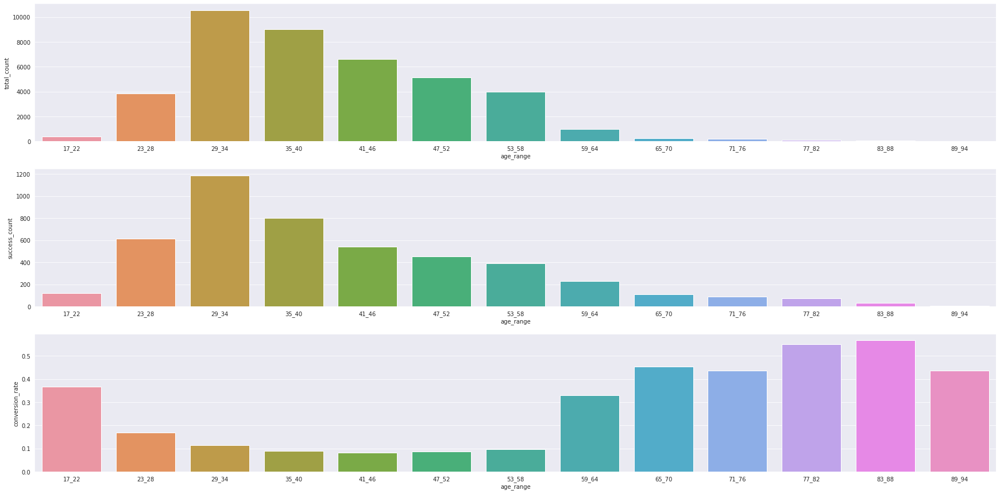

In [ ]:
#@title CONVERSION RATE AND TOTAL COUNT BY AGE GROUP OF 6
age_group_6 =[]
i = gr_age.index.min() + 6

for i in np.arange(i, gr_age.index.max()+1, 6):
  rate = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['conversion'].mean()
  counts = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['counts'].sum()
  success = gr_age[(gr_age.index >= i-6) & (gr_age.index < i)]['success_count'].sum()
  range = f'{i-6}_{i-1}'

  dicts = {'age_range'      : range,
           'conversion_rate': rate,
           'total_count'    : counts,
           'success_count'  : success}

  age_group_6.append(dicts)
  
age_group_6_df = pd.DataFrame(age_group_6)
age_group_6_df.head()

#Plotting age group
plt.figure(figsize=(30,15))

plt.subplot(313)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'conversion_rate')

plt.subplot(311)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'total_count')

plt.subplot(312)
sns.barplot(data = age_group_6_df,
            x = 'age_range',
            y = 'success_count')

plt.show()

chia theo nhom doi tuong de tra loi cau hoi san pham co nhma dung vao doi tuong di lam hay ko

In [ ]:
#@title TOTAL CONTACTED PEOPLE BY JOBS

job_edu = df.groupby(['job']).agg(conversion=('y','mean'), counts=('age','count')).sort_values(['counts'], ascending=[False])

fig = px.bar(job_edu, x=job_edu.index, y="counts", 
             labels={'counts' : 'Contacted People',
                     'job': ' '},
             color=job_edu.index, color_discrete_sequence=px.colors.sequential.Viridis, 
             title="")

fig.update_layout(
    margin=dict(l=20, r=20, t=0, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15,
    showlegend=False
)

fig.show(renderer="colab")

In [ ]:
#@title CONVERSION RATE BY JOBS

fig = px.bar(job_edu, x=job_edu.index, y="conversion", 
             labels={'conversion' : 'Conversion Rate',
                     'job': ' '},
             color=job_edu.index, color_discrete_sequence=px.colors.sequential.Viridis, 
             title="")

fig.update_layout(
    margin=dict(l=20, r=20, t=0, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15,
    showlegend=False
)

fig.show(renderer="colab")

**OBSERVATION**
- The campaign only concentrated on working age people while students and retired people are potential customers to take a try.
- Admin. and Technicians can be considered as the target customers for this product as their conversion rates are quite high at large numbers of contacts

## WHAT ARE THE BEST DAYS AND BEST MONTHS TO APPROACH?

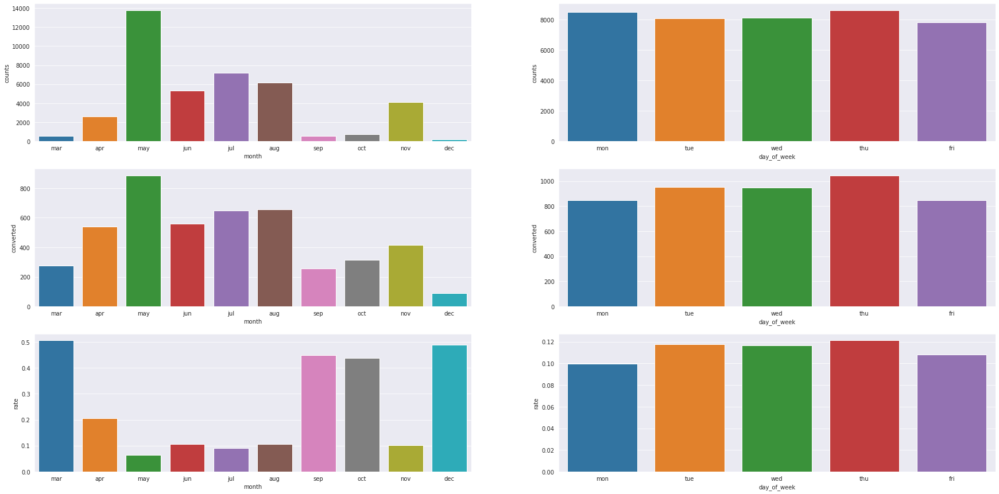

In [ ]:
#@title CONVERSION DISTRIBUTION BY MONTH AND DAY
from pandas.api.types import CategoricalDtype

# Month DataFrame
month_order = CategoricalDtype(['mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], ordered=True)
month = df.groupby('month').agg(rate=('y','mean'), counts=('y','count'))
month_yes = df[df.y ==1]
month_yes_gr = month_yes.groupby('month').agg(converted=('y','count'))
month.index = month.index.astype(month_order)
month_yes_gr.index = month_yes_gr.index.astype(month_order)

# DAY DataFrame
day_order = CategoricalDtype(['mon', 'tue', 'wed', 'thu', 'fri'], ordered=True)
day = df.groupby('day_of_week').agg(rate=('y','mean'), counts=('y','count'))
day_yes = df[df.y ==1]
day_yes_gr = day_yes.groupby('day_of_week').agg(converted=('y','count'))
day.index = day.index.astype(day_order)
day_yes_gr.index = day_yes_gr.index.astype(day_order)

plt.figure(figsize=(30,15))

plt.subplot(325)
sns.barplot(data = month,
            x = month.index,
            y = 'rate')

plt.subplot(321)
sns.barplot(data = month,
            x = month.index,
            y = 'counts')

plt.subplot(323)
sns.barplot(data = month_yes_gr,
            x = month_yes_gr.index,
            y = 'converted')

plt.subplot(326)
sns.barplot(data = day,
            x = day.index,
            y = 'rate')

plt.subplot(322)
sns.barplot(data = day,
            x = day.index,
            y = 'counts')

plt.subplot(324)
sns.barplot(data = day_yes_gr,
            x = day_yes_gr.index,
            y = 'converted')

plt.show()

**OBSERVATION**
- It seems busy months from May to August
- Monday and Friday are not really good days to convince target audiences

## WHAT IS THE MOST SUCCESSFUL CONTACT FREQUENCY?

In [ ]:
#@title Building data for plotting
campaign_df = df[list(client) + list(ccampaign)]
campaign_df['conversion'] = df['y']
campaign_df.head()

# Let's having a look at the performance of every contact frequency

campaign = campaign_df.groupby('campaign').agg(conversion=('conversion','mean'),counts=('conversion','count')).sort_values('conversion', ascending=False)
campaign['success_count'] = campaign.conversion * campaign.counts
campaign['success_count'] = campaign['success_count'].round().astype(int)
campaign.conversion = (campaign.conversion * 100).round(2).astype('float32')

# campaign.head(10).style.background_gradient(cmap='Greens').set_precision(2)

In [ ]:
#@title Good approaching strategy of 3 contact frequency

# Ploting boxplot
campaign_df_yes = campaign_df[campaign_df.conversion == 1]

fig = go.Figure()

fig.add_trace(go.Box(x = campaign_df_yes['campaign'], name='Converted',
                marker_color = '#3D9970'))

fig.add_trace(go.Box(x = campaign_df['campaign'], name='Total',
                marker_color = '#FF851B'))

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    title="CONTACT FREQUENCY DISTRIBUTION",
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15,
    showlegend=False #turn off legend
)
# fig.update_coloraxes(showscale=False) # turn off color axis
fig.show(renderer="colab")


# Finding the outlier figures
Q1 = campaign_df['campaign'].quantile(q=0.25)
Q2 = campaign_df['campaign'].quantile(q=0.50)
Q3 = campaign_df['campaign'].quantile(q=0.75)
age_IQR = Q3 - Q1
age_outlier = Q3 + 1.5*age_IQR

Q1_yes = campaign_df_yes['campaign'].quantile(q=0.25)
Q3_yes = campaign_df_yes['campaign'].quantile(q=0.75)
age_IQR_yes = Q3_yes - Q1_yes
age_outlier_yes = Q3_yes + 1.5*age_IQR_yes

print(f'\nSales agents followed the {int(age_outlier)}-call-max strategy\nThe agents have the best chance at {int(age_outlier_yes)} calls')


Sales agents followed the 6-call-max strategy
The agents have the best chance at 3 calls


In [ ]:
#@title More than 10 calls means wasting time

df_contact = df.copy()
df_contact.y = df.y.replace({0:'No'})
df_contact.y.replace({1:'Yes'},inplace=True)

fig = px.scatter(df_contact, x="campaign", y=df_contact.index, facet_row="y",
                 labels={'campaign' : 'Contact Frequency',
                         'index' : ' '},
                 title='CONTACT FREQUENCY DISTRIBUITON BY TYPE OF CONVERSION')

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=12
)

fig.update_yaxes(visible=False, showticklabels=False) #hide ytick label

fig.update_traces(marker=dict(size=6,
                              color='darkgreen',
                              ))

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1])) #

fig.show(renderer="colab")

Lam stack histogram

In [ ]:
#@title The more call frequency the less chance to convert

campain_plot = campaign.reset_index()
campain_plot.rename(columns={"campaign": "Contact Frequency"}, inplace=True)

fig = px.scatter(campain_plot, x='Contact Frequency', y='conversion',
                 labels={'conversion' : 'Conversion Rate'},
                 title='CONTACT FREQUENCY BY CONVERSION RATE')

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title Most of successful conversion were made before the 4th calls

campain_plot = campaign.reset_index()
campain_plot.rename(columns={"campaign": "Contact Frequency"}, inplace=True)

fig = px.scatter(campain_plot, x='Contact Frequency', y='conversion',
                 size='success_count', color='conversion', color_continuous_scale='greens',
                 labels={'conversion' : 'Conversion Rate',
                         'success_count': 'Converted Counts'},
                 title='CONTACT FREQUENCY BY CONVERSION RATE DISTRIBUTED WITH CONVERTED COUNT')

fig.update_layout(
    margin=dict(l=20, r=20, t=55, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)
fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

## HOW LONG DOES IT TAKE TO SATISFY YOUR TARGETS?

In [ ]:
#@title Building data for plotting
campaign_df = df[list(client) + list(ccampaign)]
campaign_df['conversion'] = df['y']
campaign_df.head()

# Let's having a look at the performance of every contact frequency

duration = campaign_df.groupby('duration').agg(conversion=('conversion','mean'),counts=('conversion','count')).sort_values('conversion', ascending=False)
duration['success_count'] = duration.conversion * duration.counts
duration['success_count'] = duration['success_count'].round().astype(int)
duration.conversion = (duration.conversion * 100).round(2).astype('float32')

In [ ]:
#@title Losers make it less than 10 minutes while 25 minutes make the targets lose their interest

# Ploting boxplot
campaign_df_yes = campaign_df[campaign_df.conversion == 1]

fig = go.Figure()

fig.add_trace(go.Box(x = campaign_df_yes['duration'], name='Converted',
                marker_color = '#3D9970'))

fig.add_trace(go.Box(x = campaign_df['duration'], name='Total',
                marker_color = '#FF851B'))

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    title="CONTACT DURATION DISTRIBUTION",
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15,
    showlegend=False #turn off legend
)
# fig.update_coloraxes(showscale=False) # turn off color axis
fig.show(renderer="colab")


# Finding the outlier figures
Q1 = campaign_df['duration'].quantile(q=0.25)
Q2 = campaign_df['duration'].quantile(q=0.50)
Q3 = campaign_df['duration'].quantile(q=0.75)
age_IQR = Q3 - Q1
age_outlier = Q3 + 1.5*age_IQR

Q1_yes = campaign_df_yes['duration'].quantile(q=0.25)
Q3_yes = campaign_df_yes['duration'].quantile(q=0.75)
age_IQR_yes = Q3_yes - Q1_yes
age_outlier_yes = Q3_yes + 1.5*age_IQR_yes

print(f"\nMost of the call was made within {int(age_outlier/60)} minutes\nHowever, the agents have the best chance within {int(age_outlier_yes/60)} minutes\nOr we can say that if a customer follows the agent's story more than {int(age_outlier/60)} minutes, it means they may be interested in the offer")


Most of the call was made within 10 minutes
However, the agents have the best chance within 24 minutes
Or we can say that if a customer follows the agent's story more than 10 minutes, it means they may be interested in the offer


group lai theo nhom bang phut theo categorical

In [ ]:
#@title CONTACT DURATION BY CONVERSION RATE

duration_plot = duration.reset_index()
duration_plot.rename(columns={"duration": "Contact Duration"}, inplace=True)

fig = px.scatter(duration_plot, x='Contact Duration', y='conversion',
                 labels={'conversion' : 'Conversion Rate'},
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title A LEGEND CAN MAKE TARGETS SAY YES IN 5 MINUTES

duration_plot = duration.reset_index()
duration_plot.rename(columns={"duration": "Contact Duration"}, inplace=True)

fig = px.scatter(duration_plot, x='Contact Duration', y='conversion',
                 color='success_count', color_continuous_scale='greens',
                 labels={'conversion' : 'Conversion Rate',
                         'success_count': 'Converted Counts'},
                 title='CONTACT DURATION BY CONVERSION RATE DISTRIBUTED WITH CONVERTED COUNT')

fig.update_layout(
    margin=dict(l=20, r=20, t=55, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

## PREVIOUS CAMPAIGN

In [ ]:
#@title THE BEST DURATION TO CONTACT A CLIENT IS BETWEEN 3-6 DAYS
df2 = df.copy()
df2.pdays = df2.pdays.apply(lambda x: 40 if x == 999 else x)
pc_df = df2.groupby('pdays').agg(rate=('y','mean'),counts=('y','count')).sort_values('counts',ascending=False).reset_index()
pc_df['success_count'] = pc_df.rate * pc_df.counts
pc_df['success_count'] = pc_df['success_count'].round().astype(float)
pc_df.rate = (pc_df.rate * 100).round(2).astype('float32')

fig1 = px.scatter(pc_df, x='pdays', y='rate', 
                  size='success_count', size_max=100, 
                  color='counts', color_continuous_scale=['green','white','orange'],
                  labels={'rate' : 'Conversion Rate',
                         'pdays':'Duration From Last Contacted (days)'},
                  title='CONVERSION RATE DISTRIBUTED BY LAST CONTACTED DURATION')

fig1.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

# fig1.update_traces(marker=dict(
#                               color='darkgreen',
#                               ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig1.show(renderer="colab")

In [ ]:
#@title PREVIOUS CUSTOMERS HAVE HIGHER CHANCE TO SAY YES AGAIN
df2 = df.copy()

pc_df = df2.groupby('poutcome').agg(rate=('y','mean'),counts=('y','count')).sort_values('counts',ascending=False).reset_index()
pc_df['success_count'] = pc_df.rate * pc_df.counts
pc_df['success_count'] = pc_df['success_count'].round().astype(float)
pc_df.rate = (pc_df.rate * 100).round(2).astype('float32')

fig1 = px.bar(pc_df, x='poutcome', color='counts',
                  y='rate', color_continuous_scale=['green','white','orange'],
                  labels={'rate' : 'Conversion Rate',
                         'poutcome':'Previous Outcome',
                          'counts': 'Contacted People'},
                  title='CONVERSION RATE DISTRIBUTED BY PREVIOUS OUTCOME')

fig1.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

# fig1.update_traces(marker=dict(
#                               color='darkgreen',
#                               ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig1.show(renderer="colab")

## EXTERNAL CONTEXTS

In [ ]:
#@title CONSUMER PRICE INDEX vs CONVERSION RATE
cpi = df.groupby('cons.price.idx').agg(rate=('y','mean')).reset_index()

fig = px.scatter(cpi, x='cons.price.idx', y='rate',
                 labels={'rate' : 'Conversion Rate',
                         'cons.price.idx': 'Consumer Price Index'},
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title CONSUMER CONFIDENCE INDEX vs CONVERSION RATE
cci = df.groupby('cons.conf.idx').agg(rate=('y','mean')).reset_index()

fig = px.scatter(cci, x='cons.conf.idx', y='rate',
                 labels={'rate' : 'Conversion Rate',
                         'cons.conf.idx': 'CONSUMER CONFIDENCE INDEX'},
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title 3 MONTHS EURIBOR RATE vs CONVERSION RATE
eur = df.groupby('euribor3m').agg(rate=('y','mean')).reset_index()

fig = px.scatter(eur, x='euribor3m', y='rate',
                 labels={'rate' : 'Conversion Rate',
                         'euribor3m': '3 months Euribor rate'},
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title EMPLOYMENT VARIANCE RATE vs CONVERSION RATE
evr = df.groupby('emp.var.rate').agg(rate=('y','mean')).reset_index()

fig = px.scatter(evr, x='emp.var.rate', y='rate',
                 labels={'rate' : 'Conversion Rate',
                         'emp.var.rate': 'EMPLOYMENT VARIANCE RATE'}, trendline="lowess",
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")

In [ ]:
#@title NUMBER OF EMPLOYEE vs CONVERSION RATE
ne = df.groupby('nr.employed').agg(rate=('y','mean')).reset_index()

fig = px.scatter(ne, x='nr.employed', y='rate',
                 labels={'rate' : 'Conversion Rate',
                         'nr.employed': 'NUMBER OF EMPLOYEE'}, trendline="lowess",
                 title='')

fig.update_layout(
    margin=dict(l=20, r=20, t=00, b=20),
    font_family="verdana",
    font_color="darkslategrey",
    font_size=15
)

fig.update_traces(marker=dict(size=12,
                              color='darkgreen',
                              ))

# fig.update_coloraxes(showscale=False) # turn off color axis

fig.show(renderer="colab")